# EDA PROJECT
in this project I'm exploring how to create a model that predicts PTS (points per game) of players for the NBA season 2024-2025

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [2]:
df = pd.read_excel(r'/Users/carlriemann/Documents/GitHub/Capstone-Two-EDA/EDA project1.xlsx')

In [3]:
df.shape

(2851, 30)

In [4]:
print(df.columns)

Index(['Player', 'Age', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA',
       '3P%', '2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB',
       'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'Tm', 'Season', 'Pos'],
      dtype='object')


In [5]:
print(df.dtypes)

Player     object
Age         int64
G           int64
GS          int64
MP        float64
FG        float64
FGA       float64
FG%       float64
3P        float64
3PA       float64
3P%       float64
2P        float64
2PA       float64
2P%       float64
eFG%      float64
FT        float64
FTA       float64
FT%       float64
ORB       float64
DRB       float64
TRB       float64
AST       float64
STL       float64
BLK       float64
TOV       float64
PF        float64
PTS       float64
Tm         object
Season     object
Pos        object
dtype: object


In [6]:
#look at data distribution
df.describe()

,Age,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
count,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,...,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000
mean,26.003858,32.648895,14.994388,18.831357,3.044265,6.691021,0.433471,0.928341,2.657945,0.288755,...,0.674803,0.817608,2.602666,3.417397,1.898246,0.594002,0.384251,1.027780,1.593581,8.282953
std,4.184472,24.403592,21.875805,9.953907,2.380347,4.928125,0.136874,0.879160,2.253676,0.161398,...,0.269452,0.761646,1.864656,2.454328,1.861117,0.423837,0.408043,0.838913,0.850303,6.586300
min,19.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,11.000000,0.000000,10.800000,1.300000,3.050000,0.391000,0.200000,0.800000,0.231000,...,0.619000,0.300000,1.200000,1.600000,0.600000,0.300000,0.100000,0.500000,1.000000,3.300000
50%,25.000000,26.000000,4.000000,18.200000,2.500000,5.400000,0.442000,0.700000,2.200000,0.333000,...,0.753000,0.600000,2.300000,3.000000,1.300000,0.500000,0.300000,0.800000,1.600000,6.500000
75%,29.000000,55.000000,22.000000,27.150000,4.300000,9.200000,0.500000,1.400000,4.000000,0.381000,...,0.839500,1.100000,3.500000,4.600000,2.500000,0.900000,0.500000,1.400000,2.200000,11.600000
max,43.000000,84.000000,82.000000,43.500000,12.800000,24.800000,1.000000,5.000000,12.400000,1.000000,...,1.000000,5.000000,11.700000,15.800000,11.800000,2.500000,3.600000,5.000000,5.000000,34.700000


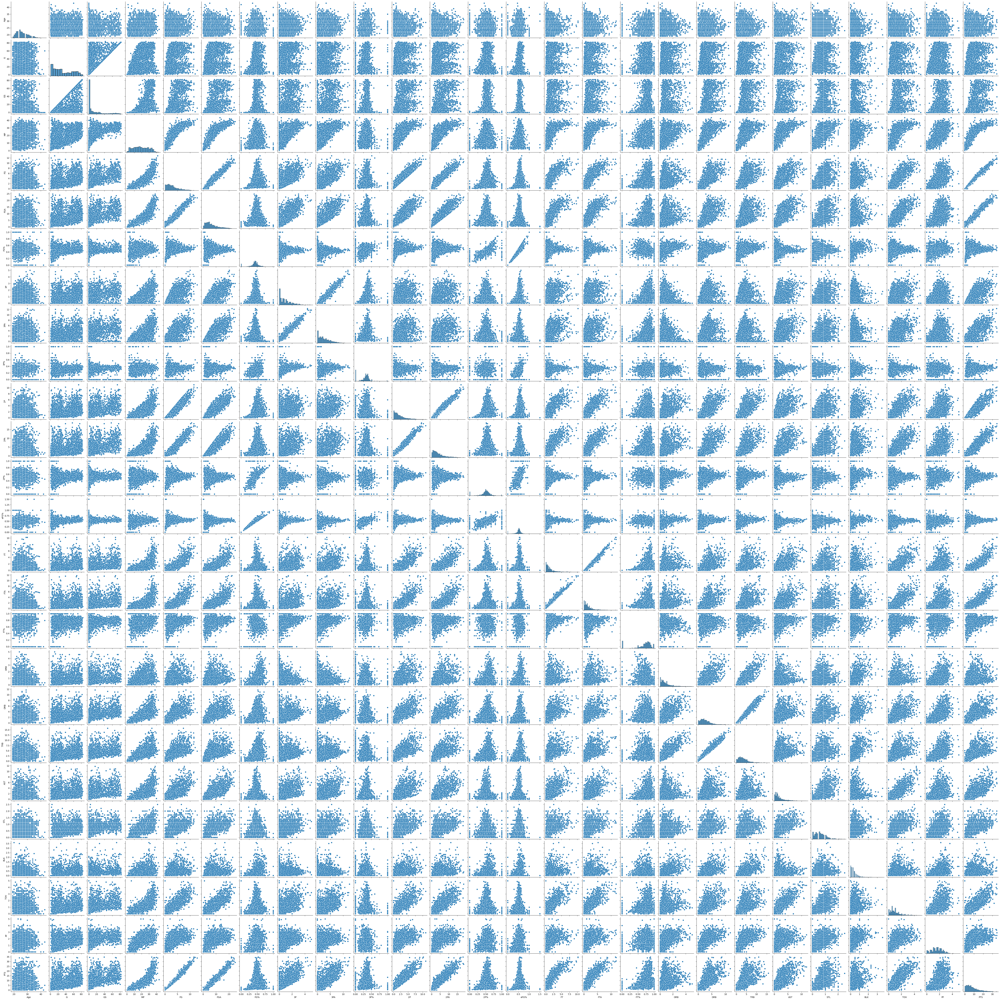

In [7]:
#visualize relationships
sns.pairplot(df)

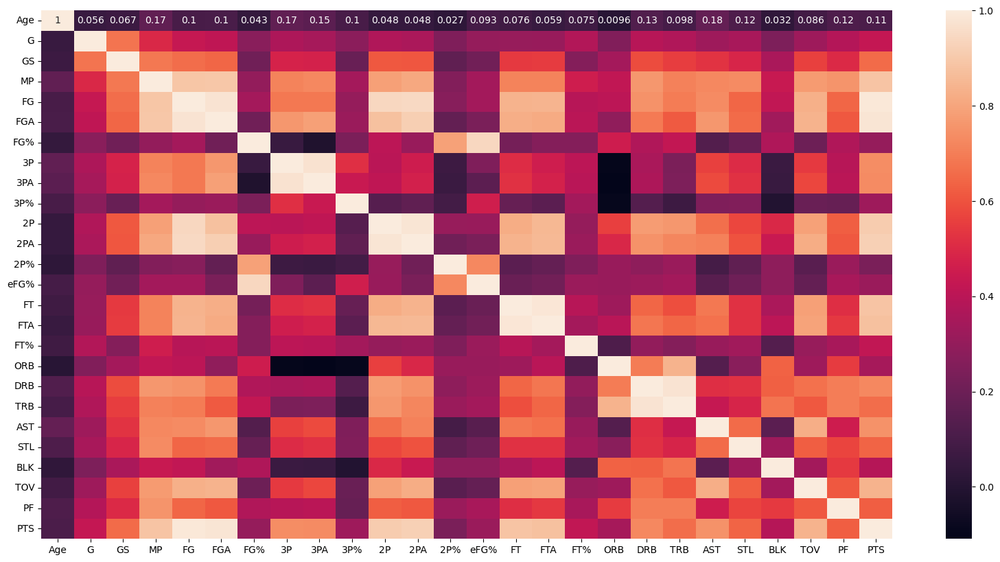

In [8]:
#visualize relationships
plt.figure(figsize=(20,10))
sns.heatmap(df.select_dtypes(include=[np.number]).corr(), annot=True)
plt.show()

In [9]:
#look for high correlation numbers
pd.set_option('display.max_columns', None)
df.select_dtypes(include=[np.number]).corr()

,Age,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
Age,1.000000,0.056313,0.067375,0.169363,0.100048,0.104144,0.043449,0.169142,0.154370,0.102612,0.048069,0.048142,0.026546,0.093453,0.076026,0.058915,0.074634,0.009601,0.125180,0.098129,0.179134,0.117135,0.031888,0.085540,0.119419,0.110822
G,0.056313,1.000000,0.676222,0.495240,0.431211,0.412619,0.276165,0.363439,0.349152,0.279253,0.373915,0.361343,0.248741,0.306688,0.308617,0.312187,0.377998,0.250671,0.391445,0.375279,0.326811,0.353386,0.243462,0.327815,0.380748,0.425515
GS,0.067375,0.676222,1.000000,0.687747,0.661124,0.642864,0.210446,0.476654,0.474155,0.187382,0.610910,0.608602,0.166018,0.212402,0.541743,0.546761,0.260678,0.342365,0.585986,0.551533,0.524446,0.487921,0.356529,0.560501,0.500526,0.655537
MP,0.169363,0.495240,0.687747,1.000000,0.887434,0.895024,0.300938,0.711353,0.723092,0.342294,0.787365,0.806663,0.258975,0.339532,0.711678,0.713614,0.455090,0.416072,0.763473,0.708916,0.725403,0.734932,0.436452,0.772140,0.756768,0.885763
FG,0.100048,0.431211,0.661124,0.887434,1.000000,0.975172,0.342783,0.686354,0.684999,0.303632,0.940933,0.946145,0.269491,0.338802,0.839195,0.841556,0.389739,0.404844,0.749629,0.694993,0.733647,0.641141,0.417879,0.827227,0.642053,0.990591
FGA,0.104144,0.412619,0.642864,0.895024,0.975172,1.000000,0.210741,0.762314,0.786705,0.317518,0.874435,0.915094,0.173064,0.235829,0.825353,0.815444,0.401977,0.292232,0.690698,0.615345,0.762576,0.655900,0.335611,0.836139,0.610898,0.979952
FG%,0.043449,0.276165,0.210446,0.300938,0.342783,0.210741,1.000000,0.058260,-0.015856,0.240807,0.404860,0.311767,0.791970,0.942182,0.222978,0.260702,0.260169,0.452762,0.372496,0.423287,0.129207,0.181244,0.371399,0.201309,0.374293,0.302452
3P,0.169142,0.363439,0.476654,0.711353,0.686354,0.762314,0.058260,1.000000,0.972753,0.517603,0.400180,0.454006,0.071743,0.247227,0.506802,0.456787,0.402870,-0.096780,0.356394,0.240910,0.561682,0.503899,0.062209,0.543198,0.391875,0.735980
3PA,0.154370,0.349152,0.474155,0.723092,0.684999,0.786705,-0.015856,0.972753,1.000000,0.438435,0.410754,0.471111,0.060350,0.157352,0.521863,0.472898,0.394431,-0.109265,0.363698,0.242539,0.583504,0.520227,0.059084,0.572318,0.401586,0.734601
3P%,0.102612,0.279253,0.187382,0.342294,0.303632,0.317518,0.240807,0.517603,0.438435,1.000000,0.141816,0.167581,0.090019,0.462303,0.184340,0.154294,0.340816,-0.096227,0.134387,0.072075,0.246077,0.251333,-0.006829,0.193166,0.183819,0.327416


In [10]:
#selecting columns with higher correlation to PTS
df[['PTS', 'FG', 'FGA', 'MP', '3P', '3PA', '2P', '2PA', 'FT', 'FTA']].corr()

,PTS,FG,FGA,MP,3P,3PA,2P,2PA,FT,FTA
PTS,1.000000,0.990591,0.979952,0.885763,0.735980,0.734601,0.906201,0.920608,0.884208,0.876052
FG,0.990591,1.000000,0.975172,0.887434,0.686354,0.684999,0.940933,0.946145,0.839195,0.841556
FGA,0.979952,0.975172,1.000000,0.895024,0.762314,0.786705,0.874435,0.915094,0.825353,0.815444
MP,0.885763,0.887434,0.895024,1.000000,0.711353,0.723092,0.787365,0.806663,0.711678,0.713614
3P,0.735980,0.686354,0.762314,0.711353,1.000000,0.972753,0.400180,0.454006,0.506802,0.456787
3PA,0.734601,0.684999,0.786705,0.723092,0.972753,1.000000,0.410754,0.471111,0.521863,0.472898
2P,0.906201,0.940933,0.874435,0.787365,0.400180,0.410754,1.000000,0.981329,0.822332,0.848526
2PA,0.920608,0.946145,0.915094,0.806663,0.454006,0.471111,0.981329,1.000000,0.838745,0.856527
FT,0.884208,0.839195,0.825353,0.711678,0.506802,0.521863,0.822332,0.838745,1.000000,0.984388
FTA,0.876052,0.841556,0.815444,0.713614,0.456787,0.472898,0.848526,0.856527,0.984388,1.000000


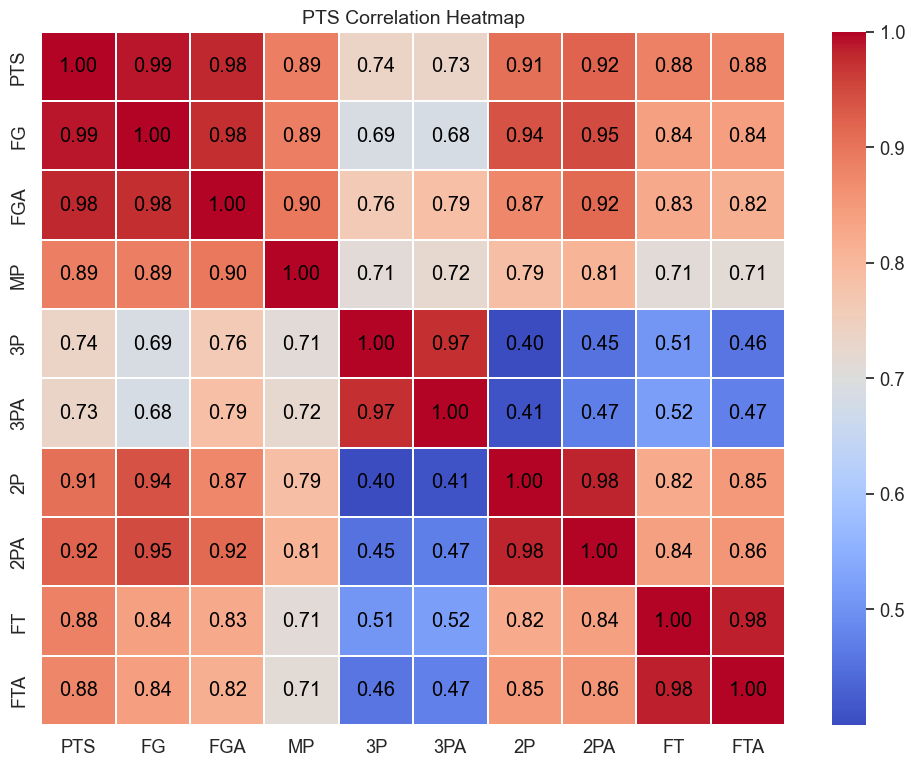

In [11]:
#plotting a heatmap of the variables with higher correlation to PTS
metrics = ['PTS', 'FG', 'FGA', 'MP', '3P', '3PA', '2P', '2PA', 'FT', 'FTA']
correlation_matrix = df[metrics].corr()

plt.figure(figsize=(12, 9))
sns.set(font_scale=1.2)
ax = sns.heatmap(correlation_matrix, cmap="coolwarm", linewidths=.05, annot=False)

#add annotations manually
for i in range(len(correlation_matrix.columns)):
    for j in range(len(correlation_matrix.columns)):
        text = ax.text(j+0.5, i+0.5, '{:0.2f}'.format(correlation_matrix.iloc[i, j]),
                       ha='center', va='center', color='black')

plt.title('PTS Correlation Heatmap', fontsize=14)
plt.show()

there is a strong correlation between PTS and the metrics FG, FGA, 2P, 2PA, indicating that these statistics are strong predictors of scoring.

also MP, 3P, 3PA, FT, and FTA also contribute to scoring but are a little less predictive than the other. 

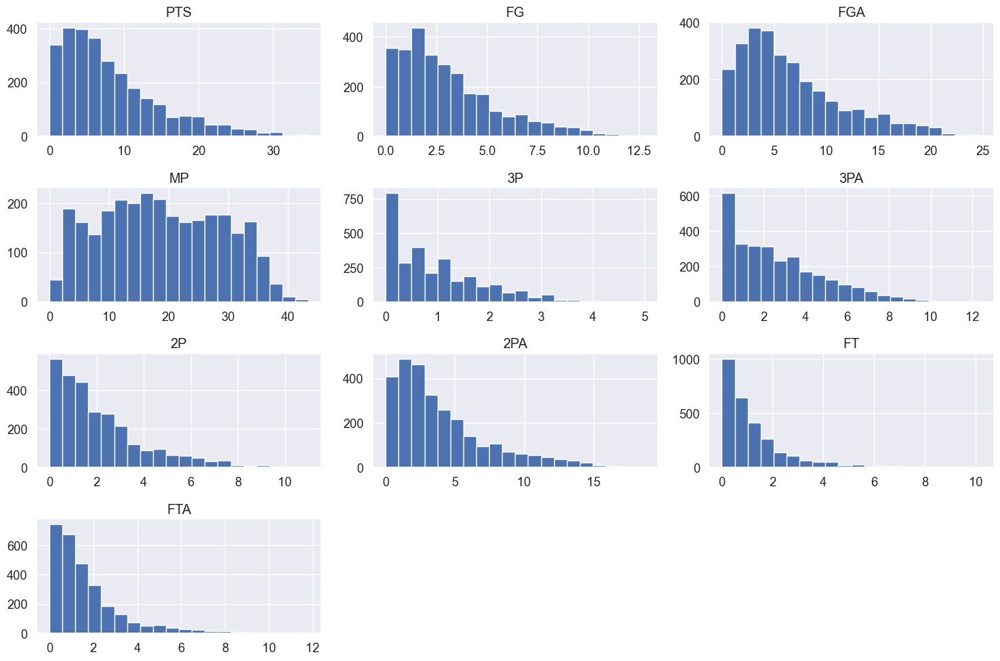

In [12]:
#create histograms to look at skewness of data
features = ['PTS', 'FG', 'FGA', 'MP', '3P', '3PA', '2P', '2PA', 'FT', 'FTA']
df[features].hist(figsize=(15, 10), bins=20, layout=(4, 3))
plt.tight_layout()
plt.show()

All histograms are right skewed except for MP which means most players have lower values for these metrics (FG, FGA, 3P, 3PA, 2P, 2PA, FT, and FTA), with fewer players achieving high values. This indicates the need to normalize the data if we want to construct a predictive model with these metrics.

For MP the data shows a more normal distribution making it a more stable and reliable measure for comparison and prediction. 

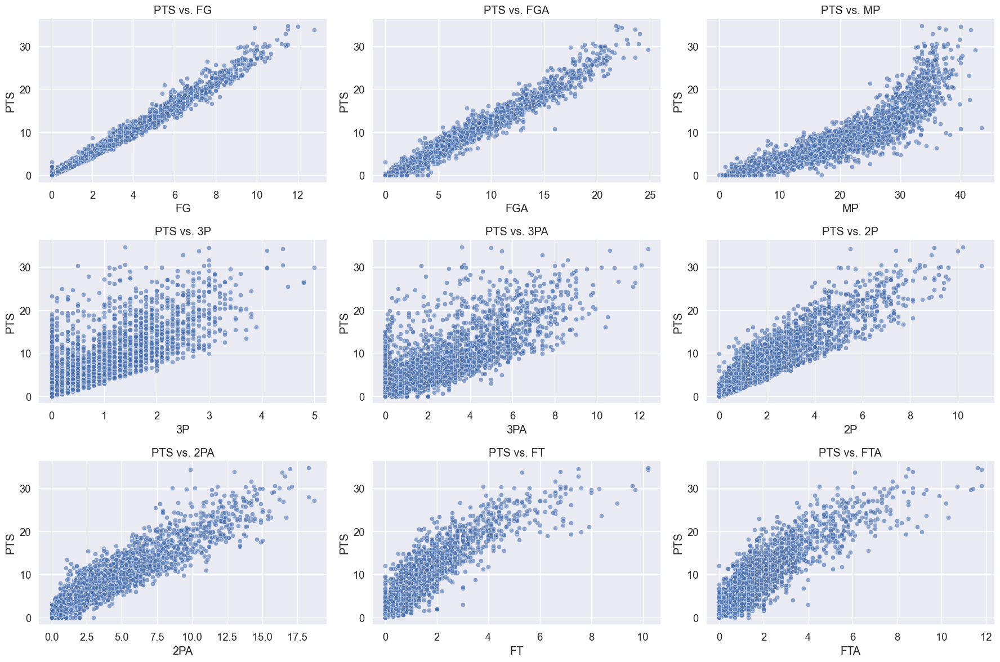

In [13]:
#create scatterplot to look for patterns and characteristics
plt.figure(figsize=(18, 12))
for i, feature in enumerate(features[1:]):
    plt.subplot(3, 3, i + 1) 
    sns.scatterplot(x=df[feature], y=df['PTS'], alpha=0.6)
    plt.title(f'PTS vs. {feature}')
plt.tight_layout()
plt.show()

There are strong positive linear relationships between PTS and FG, FGA, 2P, 2PA indicating direct and significant impacts on scoring.

Outliers and anomalies can be seen in 3P and 3PA, indicating some players might be good at scoring only 3P or shooting 3PA.

MP also shows a strong positive linear relationship with a big increase around min 30, suggesting players that play longer tend to score more points.

In [14]:
#print summary statistics
summary_stats = df[features].describe()
print(summary_stats)

               PTS           FG          FGA           MP           3P  \
count  2851.000000  2851.000000  2851.000000  2851.000000  2851.000000   
mean      8.282953     3.044265     6.691021    18.831357     0.928341   
std       6.586300     2.380347     4.928125     9.953907     0.879160   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       3.300000     1.300000     3.050000    10.800000     0.200000   
50%       6.500000     2.500000     5.400000    18.200000     0.700000   
75%      11.600000     4.300000     9.200000    27.150000     1.400000   
max      34.700000    12.800000    24.800000    43.500000     5.000000   

               3PA           2P          2PA           FT          FTA  
count  2851.000000  2851.000000  2851.000000  2851.000000  2851.000000  
mean      2.657945     2.117292     4.034655     1.272325     1.651631  
std       2.253676     1.887828     3.447010     1.383974     1.691046  
min       0.000000     0.000000     0.000

These are more general statistics that indicate the averages(mean) and other statistics of all players in these columns.